# PHASE 3

# SQL OPERATIONS

In [2]:
!pip install ipython-sql

Defaulting to user installation because normal site-packages is not writeable
  Obtaining dependency information for ipython-sql from https://files.pythonhosted.org/packages/30/8f/9e50fa53ffc371483f9d1b90c1175b706d28a2e978e90a8894035af01905/ipython_sql-0.5.0-py3-none-any.whl.metadata
  Obtaining dependency information for prettytable from https://files.pythonhosted.org/packages/3d/c4/a32f4bf44faf95accbbd5d7864ddef9e289749a8efbc3adaad4a4671779a/prettytable-3.10.0-py3-none-any.whl.metadata
  Obtaining dependency information for sqlalchemy>=2.0 from https://files.pythonhosted.org/packages/4b/f8/c1fe26782e875a952f1bad265034185dbd888f6c55d4bb5f0f515e172b8d/SQLAlchemy-2.0.28-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for sqlparse from https://files.pythonhosted.org/packages/98/5a/66d7c9305baa9f11857f247d4ba761402cea75db6058ff850ed7128957b7/sqlparse-0.4.4-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
    -------------

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


# PREPARING DATASETS FOR SQL OPERATIONS.

1)DISTRICT WISE CRIME AGAINST WOMEN

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('42_District_wise_crimes_committed_against_women_2001_2012.csv')
df

,STATE/UT,DISTRICT,Year,Rape,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,1,0,1,0
9014,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0
9015,PUDUCHERRY,PUDUCHERRY,2012,7,14,0,7,2,5,0


In [4]:
df.shape

(9017, 10)

In [5]:
df.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Rape',
 'Kidnapping and Abduction',
 'Dowry Deaths',
 'Assault on women with intent to outrage her modesty',
 'Insult to modesty of Women',
 'Cruelty by Husband or his Relatives',
 'Importation of Girls']

In [6]:
df.columns=['STATE_UT',
 'DISTRICT',
 'Year',
 'Rape',
 'Kidnapping_and_Abduction',
 'Dowry_Deaths',
 'Assault_on_women_with_intent_to_outrage_her_modesty',
 'Insult_to_modesty_of_Women',
 'Cruelty_by_Husband_or_his_Relatives',
 'Importation_of_Girls']

In [7]:
df.columns.to_list()

['STATE_UT',
 'DISTRICT',
 'Year',
 'Rape',
 'Kidnapping_and_Abduction',
 'Dowry_Deaths',
 'Assault_on_women_with_intent_to_outrage_her_modesty',
 'Insult_to_modesty_of_Women',
 'Cruelty_by_Husband_or_his_Relatives',
 'Importation_of_Girls']

In [8]:
#Checking null values.
df.isnull().sum()

STATE_UT                                               0
DISTRICT                                               0
Year                                                   0
Rape                                                   0
Kidnapping_and_Abduction                               0
Dowry_Deaths                                           0
Assault_on_women_with_intent_to_outrage_her_modesty    0
Insult_to_modesty_of_Women                             0
Cruelty_by_Husband_or_his_Relatives                    0
Importation_of_Girls                                   0
dtype: int64

In [9]:
#Checking for duplicates
df.duplicated().sum()

0

In [10]:
df[df.duplicated()]

,STATE_UT,DISTRICT,Year,Rape,Kidnapping_and_Abduction,Dowry_Deaths,Assault_on_women_with_intent_to_outrage_her_modesty,Insult_to_modesty_of_Women,Cruelty_by_Husband_or_his_Relatives,Importation_of_Girls


In [11]:
df['DISTRICT'].value_counts()

TOTAL              408
G.R.P.              46
SOUTH               37
NORTH               37
WEST                36
                  ... 
RAILWAYS KMR         1
MIDNAPUR             1
KAWARDHA             1
A and N ISLANDS      1
CAR                  1
Name: DISTRICT, Length: 808, dtype: int64

In [12]:
#Dropping irrevalent datas
df = df.drop(list(df[df['DISTRICT'] == 'TOTAL'].index))

In [13]:
#saving the dataset
df.to_csv('2001_to_2012_District_wise_crimes_committed_against_women.csv',index=False)

2.DISTRICT WISE CRIMES AGAINST ST. 

In [193]:
df=pd.read_csv('02_District_wise_crimes_committed_against_ST_2001_2012.csv')
df

,STATE/UT,DISTRICT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0
9014,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,0,0,0
9015,PUDUCHERRY,KARAIKAL,2012,0,0,0,0,0,0,0,0,0,0
9016,PUDUCHERRY,PUDUCHERRY,2012,0,0,0,0,0,0,0,0,0,0


In [15]:
df.shape

(9018, 13)

In [16]:
df.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Protection of Civil Rights (PCR) Act',
 'Prevention of atrocities (POA) Act',
 'Other Crimes Against STs']

In [17]:
df.columns=['STATE_UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping_Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Protection_of_Civil_Rights_(PCR)_Act',
 'Prevention_of_atrocities_(POA)_Act',
 'Other_Crimes_Against_STs']

In [18]:
df.columns.to_list()

['STATE_UT',
 'DISTRICT',
 'Year',
 'Murder',
 'Rape',
 'Kidnapping_Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Protection_of_Civil_Rights_(PCR)_Act',
 'Prevention_of_atrocities_(POA)_Act',
 'Other_Crimes_Against_STs']

In [19]:
#Checking null values.
df.isnull().sum()

STATE_UT                                0
DISTRICT                                0
Year                                    0
Murder                                  0
Rape                                    0
Kidnapping_Abduction                    0
Dacoity                                 0
Robbery                                 0
Arson                                   0
Hurt                                    0
Protection_of_Civil_Rights_(PCR)_Act    0
Prevention_of_atrocities_(POA)_Act      0
Other_Crimes_Against_STs                0
dtype: int64

In [22]:
df['DISTRICT'].value_counts()

TOTAL              421
G.R.P.              46
SOUTH               37
NORTH               37
WEST                36
                  ... 
A and N ISLANDS      1
N.C. HILLS           1
G.R.P. JODHPUR       1
BAKSA                1
CAR                  1
Name: DISTRICT, Length: 813, dtype: int64

In [196]:
#Dropping irrevalent datas
df = df.drop(list(df[df['DISTRICT'] == 'TOTAL'].index))

In [24]:
#saving the dataset
df.to_csv('2001_to_2012_District_wise_crimes_committed_against_ST.csv',index=False)

3.DISTRICT WISE CRIMES COMMITED IPC from 2001 to 2012.

In [143]:
df=pd.read_csv('01_District_wise_crimes_committed_IPC_2001_2012.csv')
df

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9013,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60
9014,PUDUCHERRY,KARAIKAL,2012,5,6,2,6,0,6,2,...,1,186,0,2,0,1,0,44,392,787
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,10,7,0,7,17,...,20,632,0,7,2,5,0,219,1668,3494


In [144]:
df.shape

(9017, 33)

In [145]:
df.columns.to_list()

['STATE/UT',
 'DISTRICT',
 'YEAR',
 'MURDER',
 'ATTEMPT TO MURDER',
 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
 'RAPE',
 'CUSTODIAL RAPE',
 'OTHER RAPE',
 'KIDNAPPING & ABDUCTION',
 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
 'KIDNAPPING AND ABDUCTION OF OTHERS',
 'DACOITY',
 'PREPARATION AND ASSEMBLY FOR DACOITY',
 'ROBBERY',
 'BURGLARY',
 'THEFT',
 'AUTO THEFT',
 'OTHER THEFT',
 'RIOTS',
 'CRIMINAL BREACH OF TRUST',
 'CHEATING',
 'COUNTERFIETING',
 'ARSON',
 'HURT/GREVIOUS HURT',
 'DOWRY DEATHS',
 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
 'INSULT TO MODESTY OF WOMEN',
 'CRUELTY BY HUSBAND OR HIS RELATIVES',
 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
 'CAUSING DEATH BY NEGLIGENCE',
 'OTHER IPC CRIMES',
 'TOTAL IPC CRIMES']

In [146]:
#Checking null values.
df.isnull().sum()

STATE/UT                                               0
DISTRICT                                               0
YEAR                                                   0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                                             0
KIDNAPPING & ABDUCTION                                 0
KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS            0
KIDNAPPING AND ABDUCTION OF OTHERS                     0
DACOITY                                                0
PREPARATION AND ASSEMBLY FOR DACOITY                   0
ROBBERY                                                0
BURGLARY                                               0
THEFT                                                  0
AUTO THEFT                     

In [29]:
#Checking for duplicates
df.duplicated().sum()

0

In [147]:
df_new = df[['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER','RAPE']]
df_new

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,RAPE
0,ANDHRA PRADESH,ADILABAD,2001,101,60,50
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,23
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,27
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,20
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,23
...,...,...,...,...,...,...
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0
9013,LAKSHADWEEP,TOTAL,2012,0,0,0
9014,PUDUCHERRY,KARAIKAL,2012,5,6,6
9015,PUDUCHERRY,PUDUCHERRY,2012,24,21,7


In [148]:
df_new = df_new.drop(list(df_new[df_new['DISTRICT'] == 'TOTAL'].index))

In [150]:
df_new = df_new.drop(list(df_new[df_new['DISTRICT'] == 'DELHI UT TOTAL'].index))

In [151]:
df_new.shape

(8597, 6)

In [152]:
df_new.columns.to_list()

['STATE/UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER', 'RAPE']

In [153]:
#Renaming columns for SQL OPERATIONS
df_new.columns=['STATE_UT', 'DISTRICT', 'YEAR', 'MURDER', 'ATTEMPT_TO_MURDER', 'RAPE']

In [154]:
df_new

,STATE_UT,DISTRICT,YEAR,MURDER,ATTEMPT_TO_MURDER,RAPE
0,ANDHRA PRADESH,ADILABAD,2001,101,60,50
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,23
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,27
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,20
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,23
...,...,...,...,...,...,...
9010,DELHI UT,STF,2012,0,1,0
9011,DELHI UT,WEST,2012,52,37,79
9012,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0
9014,PUDUCHERRY,KARAIKAL,2012,5,6,6


In [155]:
#saving the dataset
df_new.to_csv('2001_to_2012_DISTRICT_wise_IPC_Crimes_',index=False)

Now, our datasets have been prepared, we will move on to SQL OPERATIONS.

# SQL OPERATIONS.

# 3.1 Insert records from 42_District_wise_crimes_committed_against_women_2001_2012.csv into a table.

In [37]:
#Importing libraries
import pandas as pd
import sqlite3

In [38]:
#Using sqlite3 library to create a connection
cnn = sqlite3.connect('CRIMES.db')


In [182]:
df = pd.read_csv('2001_to_2012_District_wise_crimes_committed_against_women.csv')
df

,STATE_UT,DISTRICT,Year,Rape,Kidnapping_and_Abduction,Dowry_Deaths,Assault_on_women_with_intent_to_outrage_her_modesty,Insult_to_modesty_of_Women,Cruelty_by_Husband_or_his_Relatives,Importation_of_Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
...,...,...,...,...,...,...,...,...,...,...
8604,DELHI,STF,2012,0,0,0,0,0,0,0
8605,DELHI,WEST,2012,79,256,18,53,6,327,0
8606,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,1,0,1,0
8607,PUDUCHERRY,KARAIKAL,2012,6,2,0,2,0,1,0


In [183]:
#Adding datas from dataframe to the database('CRIMES.db') with the table name 'Crimes_Women'.
df.to_sql('Crimes_Women', cnn)

8609

In [41]:
#Loading the Sql module to ipython
%load_ext sql

In [42]:
#pointing jupyter sql library to database 
%sql sqlite:///CRIMES.db

In [43]:
%%sql

SELECT *
FROM Crimes_Women

 * sqlite:///CRIMES.db
Done.


index,STATE_UT,DISTRICT,Year,Rape,Kidnapping_and_Abduction,Dowry_Deaths,Assault_on_women_with_intent_to_outrage_her_modesty,Insult_to_modesty_of_Women,Cruelty_by_Husband_or_his_Relatives,Importation_of_Girls
0,ANDHRA PRADESH,ADILABAD,2001,50,30,16,149,34,175,0
1,ANDHRA PRADESH,ANANTAPUR,2001,23,30,7,118,24,154,0
2,ANDHRA PRADESH,CHITTOOR,2001,27,34,14,112,83,186,0
3,ANDHRA PRADESH,CUDDAPAH,2001,20,20,17,126,38,57,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,23,26,12,109,58,247,0
5,ANDHRA PRADESH,GUNTAKAL RLY.,2001,0,0,0,1,0,0,0
6,ANDHRA PRADESH,GUNTUR,2001,54,51,7,139,129,378,0
7,ANDHRA PRADESH,HYDERABAD CITY,2001,37,39,24,118,27,746,0
8,ANDHRA PRADESH,KARIMNAGAR,2001,56,49,62,414,81,224,0
9,ANDHRA PRADESH,KHAMMAM,2001,47,30,17,180,336,172,0


# 3.2 Write SQL query to find the highest number of rapes & Kidnappings that happened in which state, District, and year.

In [181]:
%%sql

SELECT STATE_UT, DISTRICT, Year, Rape, Kidnapping_and_Abduction as 'Kidnappings'
FROM Crimes_Women
ORDER BY Rape DESC, Kidnapping_and_Abduction DESC
LIMIT 1

 * sqlite:///CRIMES.db
Done.


STATE_UT,DISTRICT,Year,Rape,Kidnappings
DELHI,DELHI UT TOTAL,2012,706,2160


# 3.3 Write SQL query to find All the lowest number of rapes & Kidnappings that happened in which state, District, and year

In [45]:
%%sql

SELECT STATE_UT, DISTRICT, Year, min(Rape) as 'Lowest no.of Rapes', min(Kidnapping_and_Abduction) as 'Lowest no.of Kidnappings'
FROM Crimes_Women
GROUP BY STATE_UT,DISTRICT,Year
ORDER BY Rape ASC, Kidnapping_and_Abduction ASC

 * sqlite:///CRIMES.db
Done.


STATE_UT,DISTRICT,Year,Lowest no.of Rapes,Lowest no.of Kidnappings
A & N ISLANDS,NICOBAR,2001,0,0
A & N ISLANDS,NICOBAR,2003,0,0
A & N ISLANDS,NICOBAR,2004,0,0
A & N ISLANDS,NICOBAR,2005,0,0
A & N ISLANDS,NICOBAR,2006,0,0
A & N ISLANDS,NICOBAR,2008,0,0
A & N ISLANDS,NICOBAR,2009,0,0
A & N ISLANDS,NICOBAR,2011,0,0
ANDHRA PRADESH,GUNTAKAL RLY.,2001,0,0
ANDHRA PRADESH,GUNTAKAL RLY.,2004,0,0


# 3.4 Insert records from 02_District_wise_crimes_committed_against_ST_2001_2012.csv into a new table

In [184]:
df_1 = pd.read_csv('2001_to_2012_District_wise_crimes_committed_against_ST.csv')
df_1

,STATE_UT,DISTRICT,Year,Murder,Rape,Kidnapping_Abduction,Dacoity,Robbery,Arson,Hurt,Protection_of_Civil_Rights_(PCR)_Act,Prevention_of_atrocities_(POA)_Act,Other_Crimes_Against_STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8592,DELHI,STF,2012,0,0,0,0,0,0,0,0,0,0
8593,DELHI,WEST,2012,0,0,0,0,0,0,0,0,0,0
8594,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0
8595,PUDUCHERRY,KARAIKAL,2012,0,0,0,0,0,0,0,0,0,0


In [185]:
#Adding datas from dataframe to the database('CRIMES.db') with the table name 'Crimes_Against_ST'.
df_1.to_sql('Crimes_Against_ST', cnn)

8597

In [47]:
%%sql

SELECT *
FROM Crimes_Against_ST

 * sqlite:///CRIMES.db
Done.


index,STATE_UT,DISTRICT,Year,Murder,Rape,Kidnapping_Abduction,Dacoity,Robbery,Arson,Hurt,Protection_of_Civil_Rights_(PCR)_Act,Prevention_of_atrocities_(POA)_Act,Other_Crimes_Against_STs
0,ANDHRA PRADESH,ADILABAD,2001,0,1,2,0,0,0,2,0,0,13
1,ANDHRA PRADESH,ANANTAPUR,2001,0,0,0,0,0,0,7,0,1,6
2,ANDHRA PRADESH,CHITTOOR,2001,0,0,0,0,0,0,2,0,0,0
3,ANDHRA PRADESH,CUDDAPAH,2001,0,0,0,0,0,0,2,0,2,0
4,ANDHRA PRADESH,EAST GODAVARI,2001,0,0,0,0,0,0,0,0,0,14
5,ANDHRA PRADESH,GUNTAKAL RLY.,2001,0,0,0,0,0,0,0,0,0,0
6,ANDHRA PRADESH,GUNTUR,2001,0,2,1,0,0,0,10,0,3,19
7,ANDHRA PRADESH,HYDERABAD CITY,2001,0,0,0,0,0,0,0,0,0,2
8,ANDHRA PRADESH,KARIMNAGAR,2001,0,0,0,0,0,0,15,0,0,2
9,ANDHRA PRADESH,KHAMMAM,2001,1,4,0,0,0,0,8,0,9,20


# 3.5 Write SQL query to find the highest number of dacoity/robbery in which district.

Highest number of Dacoity on which District

In [48]:
%%sql

SELECT STATE_UT, DISTRICT, Dacoity as 'Maximum no. of Dacoity'
FROM Crimes_Against_ST
ORDER BY Dacoity DESC
LIMIT 1

 * sqlite:///CRIMES.db
Done.


STATE_UT,DISTRICT,Maximum no. of Dacoity
GUJARAT,DAHOD,29


Highest number of Dacoity on which District

In [49]:
%%sql

SELECT STATE_UT, DISTRICT, Robbery as 'Maximum no. of Robbery'
FROM Crimes_Against_ST
ORDER BY Robbery DESC
LIMIT 1

 * sqlite:///CRIMES.db
Done.


STATE_UT,DISTRICT,Maximum no. of Robbery
GUJARAT,DAHOD,32


# 3.6 Write SQL query to find in which districts(All) the lowest number of murders happened.

In [50]:
%%sql

SELECT DISTRICT, min(Murder) as 'Lowest No.of Murders'
FROM Crimes_Against_ST
GROUP BY DISTRICT

 * sqlite:///CRIMES.db
Done.


DISTRICT,Lowest No.of Murders
24 PARGANAS NORTH,0
24 PARGANAS SOUTH,0
A and N ISLANDS,0
ADILABAD,0
AGRA,0
AHMEDABAD COMMR.,0
AHMEDABAD RURAL,0
AHMEDNAGAR,0
AHWA-DANG,0
AIZAWL,0


# 3.7 Write SQL query to find the number of murders in ascending order in district and yearwise.

In [51]:
%%sql

SELECT DISTRICT, Year, Murder as 'No.of Murders'
FROM Crimes_Against_ST
ORDER BY DISTRICT ASC, Murder ASC, Year ASC

 * sqlite:///CRIMES.db
Done.


DISTRICT,Year,No.of Murders
24 PARGANAS NORTH,2001,0
24 PARGANAS NORTH,2002,0
24 PARGANAS NORTH,2003,0
24 PARGANAS NORTH,2004,0
24 PARGANAS NORTH,2005,0
24 PARGANAS NORTH,2006,0
24 PARGANAS NORTH,2007,0
24 PARGANAS NORTH,2008,0
24 PARGANAS NORTH,2009,0
24 PARGANAS NORTH,2010,0


# 3.8.1 Insert records of STATE/UT, DISTRICT, YEAR, MURDER, ATTEMPT TO MURDER, and RAPE columns only from 01_District_wise_crimes_committed_IPC_2001_2012.csv into a new table

In [157]:
df_2 = pd.read_csv('2001_to_2012_DISTRICT_wise_IPC_Crimes_.csv')
df_2

,STATE_UT,DISTRICT,YEAR,MURDER,ATTEMPT_TO_MURDER,RAPE
0,ANDHRA PRADESH,ADILABAD,2001,101,60,50
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,23
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,27
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,20
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,23
...,...,...,...,...,...,...
8592,DELHI UT,STF,2012,0,1,0
8593,DELHI UT,WEST,2012,52,37,79
8594,LAKSHADWEEP,LAKSHADWEEP,2012,0,0,0
8595,PUDUCHERRY,KARAIKAL,2012,5,6,6


In [158]:
#Adding datas from dataframe to the database('CRIMES.db') with the table name 'IPC CRIMES'.
df_2.to_sql('IPC_Crimes_DISTRICT_wise', cnn)

8597

In [159]:
%%sql

SELECT *
FROM IPC_Crimes_DISTRICT_wise

 * sqlite:///CRIMES.db
Done.


index,STATE_UT,DISTRICT,YEAR,MURDER,ATTEMPT_TO_MURDER,RAPE
0,ANDHRA PRADESH,ADILABAD,2001,101,60,50
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,23
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,27
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,20
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,23
5,ANDHRA PRADESH,GUNTAKAL RLY.,2001,3,1,0
6,ANDHRA PRADESH,GUNTUR,2001,182,88,54
7,ANDHRA PRADESH,HYDERABAD CITY,2001,111,113,37
8,ANDHRA PRADESH,KARIMNAGAR,2001,162,85,56
9,ANDHRA PRADESH,KHAMMAM,2001,93,60,47


# 3.8.2 Write SQL query to find which District in each state/ut has the highest number of murders yearwise. Your output should show STATE/UT, YEAR, DISTRICT, and MURDERS.

In [208]:
%%sql

SELECT STATE_UT, Year, DISTRICT, max(Murder) as 'Maximum Murders'
FROM IPC_Crimes_DISTRICT_wise
GROUP BY STATE_UT,Year
ORDER BY Year ASC

 * sqlite:///CRIMES.db
Done.


STATE_UT,YEAR,DISTRICT,Maximum Murders
A & N ISLANDS,2001,ANDAMAN,13
ANDHRA PRADESH,2001,RANGA REDDY,214
ARUNACHAL PRADESH,2001,LOHIT,16
ASSAM,2001,DIBRUGARH,110
BIHAR,2001,PATNA,434
CHANDIGARH,2001,CHANDIGARH,15
CHHATTISGARH,2001,SARGUJA,105
D & N HAVELI,2001,D and N HAVELI,3
DAMAN & DIU,2001,DAMAN,6
DELHI UT,2001,NORTH WEST,134


# 3.8.3 Store the above data (the result of 3.8.2) in DataFrame and analyze districts that appear 3 or more than 3 years and print the corresponding state/ut, district, murders, and year in descending order.

In [209]:
sql_query = pd.read_sql_query ('''
                                SELECT STATE_UT, Year, DISTRICT, max(Murder) as 'Maximum_Murders'
                                FROM IPC_Crimes_DISTRICT_wise
                                GROUP BY STATE_UT,Year
                                ORDER BY Year ASC ''', cnn)

In [210]:
#Creating the dataframe based on sql query results from 3.8.2
Crime_murder = pd.DataFrame(sql_query)
Crime_murder

,STATE_UT,YEAR,DISTRICT,Maximum_Murders
0,A & N ISLANDS,2001,ANDAMAN,13
1,ANDHRA PRADESH,2001,RANGA REDDY,214
2,ARUNACHAL PRADESH,2001,LOHIT,16
3,ASSAM,2001,DIBRUGARH,110
4,BIHAR,2001,PATNA,434
...,...,...,...,...
415,TAMIL NADU,2012,CHENNAI,180
416,TRIPURA,2012,WEST,26
417,UTTAR PRADESH,2012,MEERUT,202
418,UTTARAKHAND,2012,HARIDWAR,74


In [211]:
Crime_murder['DISTRICT'].value_counts()

WEST                14
PATNA               12
CHANDIGARH          12
D and N HAVELI      12
DAMAN               12
                    ..
KANPUR NAGAR         1
MANDI                1
CHENGAI              1
A and N ISLANDS      1
TRIVANDRUM RURAL     1
Name: DISTRICT, Length: 92, dtype: int64

In [212]:
#Adding datas from dataframe to the database('CRIMES.db') with the table name ''.
Crime_murder.to_sql('MURDERS_DISTRICT_', cnn)

420

In [218]:
%%sql

SELECT c.STATE_UT, c.DISTRICT, c.Maximum_Murders, c.YEAR
FROM MURDERS_DISTRICT_ c
        INNER JOIN (SELECT
                        DISTRICT, COUNT(DISTRICT) AS CountOf
                        FROM MURDERS_DISTRICT_
                        GROUP BY STATE_UT,DISTRICT
                        HAVING COUNT(*)>=3
                        ORDER BY Maximum_Murders ASC
                    ) dt ON c.DISTRICT=dt.DISTRICT

 * sqlite:///CRIMES.db
Done.


STATE_UT,DISTRICT,Maximum_Murders,YEAR
A & N ISLANDS,ANDAMAN,13,2001
ARUNACHAL PRADESH,LOHIT,16,2001
ASSAM,DIBRUGARH,110,2001
BIHAR,PATNA,434,2001
CHANDIGARH,CHANDIGARH,15,2001
CHHATTISGARH,SARGUJA,105,2001
D & N HAVELI,D and N HAVELI,3,2001
DAMAN & DIU,DAMAN,6,2001
DELHI UT,NORTH WEST,134,2001
GOA,NORTH GOA,22,2001


# Creating dataframe for Districts that appear 3 or more than 3 years.

In [219]:
sql_query = pd.read_sql_query ('''
                                SELECT c.STATE_UT, c.DISTRICT, c.Maximum_Murders as 'No.of Murders', c.YEAR
                                FROM MURDERS_DISTRICT_ c
                                    INNER JOIN (SELECT
                                                DISTRICT, COUNT(DISTRICT) AS CountOf
                                                FROM MURDERS_DISTRICT_
                                                GROUP BY STATE_UT,DISTRICT
                                                HAVING COUNT(*)>=3
                                                ORDER BY Maximum_Murders ASC
                                            ) dt ON c.DISTRICT=dt.DISTRICT ''', cnn)

In [220]:
df = pd.DataFrame(sql_query)
df

,STATE_UT,DISTRICT,No.of Murders,YEAR
0,A & N ISLANDS,ANDAMAN,13,2001
1,ARUNACHAL PRADESH,LOHIT,16,2001
2,ASSAM,DIBRUGARH,110,2001
3,BIHAR,PATNA,434,2001
4,CHANDIGARH,CHANDIGARH,15,2001
...,...,...,...,...
355,SIKKIM,EAST,3,2012
356,TAMIL NADU,CHENNAI,180,2012
357,TRIPURA,WEST,26,2012
358,UTTARAKHAND,HARIDWAR,74,2012


In [221]:
df['DISTRICT'].value_counts()

WEST                 14
D and N HAVELI       12
BANGALORE COMMR.     12
DAMAN                12
LAKSHADWEEP          12
CHANDIGARH           12
PATNA                12
AIZAWL               11
KANGRA               11
HARIDWAR             10
NORTH GOA            10
DIMAPUR              10
RANCHI               10
ANDAMAN              10
CHENNAI               9
LOHIT                 9
JAINTIA HILLS         9
EAST                  9
SURAT COMMR.          9
24 PARGANAS NORTH     8
CYBERABAD             7
PONDICHERRY           7
MUMBAI COMMR.         7
ALWAR                 6
BILASPUR              6
JHABUA                6
INDORE                6
MUMBAI                5
DIBRUGARH             5
TINSUKIA              5
GURGAON               5
MUZAFFARNAGAR         5
PALAKKAD              5
JALANDHAR             5
MAYURBHANJ            5
BARAMULLA             5
PUDUCHERRY            5
KEONJHAR              4
OUTER                 4
LUDHIANA              4
BHARATPUR             4
NORTH WEST      

In [222]:
df.sort_values(by=['DISTRICT'])

,STATE_UT,DISTRICT,No.of Murders,YEAR
91,WEST BENGAL,24 PARGANAS NORTH,193,2003
31,WEST BENGAL,24 PARGANAS NORTH,202,2001
121,WEST BENGAL,24 PARGANAS NORTH,177,2004
149,WEST BENGAL,24 PARGANAS NORTH,168,2005
177,WEST BENGAL,24 PARGANAS NORTH,154,2006
...,...,...,...,...
147,TRIPURA,WEST,61,2005
296,TRIPURA,WEST,83,2010
357,TRIPURA,WEST,26,2012
118,TRIPURA,WEST,97,2004


In [223]:
df_new = df.sort_values(by=['STATE_UT', 'No.of Murders'],ascending=[True, False])
df_new

,STATE_UT,DISTRICT,No.of Murders,YEAR
63,A & N ISLANDS,ANDAMAN,16,2003
241,A & N ISLANDS,ANDAMAN,15,2009
32,A & N ISLANDS,ANDAMAN,14,2002
122,A & N ISLANDS,ANDAMAN,14,2005
297,A & N ISLANDS,ANDAMAN,14,2011
...,...,...,...,...
208,WEST BENGAL,24 PARGANAS NORTH,194,2007
91,WEST BENGAL,24 PARGANAS NORTH,193,2003
121,WEST BENGAL,24 PARGANAS NORTH,177,2004
149,WEST BENGAL,24 PARGANAS NORTH,168,2005


# 3.8.4 Use appropriate graphs to show your data (the result of 3.8.3)

Districts that appear 3 or more than 3 years in highest no.of murders happened.

In [224]:
df

,STATE_UT,DISTRICT,No.of Murders,YEAR
0,A & N ISLANDS,ANDAMAN,13,2001
1,ARUNACHAL PRADESH,LOHIT,16,2001
2,ASSAM,DIBRUGARH,110,2001
3,BIHAR,PATNA,434,2001
4,CHANDIGARH,CHANDIGARH,15,2001
...,...,...,...,...
355,SIKKIM,EAST,3,2012
356,TAMIL NADU,CHENNAI,180,2012
357,TRIPURA,WEST,26,2012
358,UTTARAKHAND,HARIDWAR,74,2012


In [236]:
data = df['DISTRICT'].value_counts()
data

WEST                 14
D and N HAVELI       12
BANGALORE COMMR.     12
DAMAN                12
LAKSHADWEEP          12
CHANDIGARH           12
PATNA                12
AIZAWL               11
KANGRA               11
HARIDWAR             10
NORTH GOA            10
DIMAPUR              10
RANCHI               10
ANDAMAN              10
CHENNAI               9
LOHIT                 9
JAINTIA HILLS         9
EAST                  9
SURAT COMMR.          9
24 PARGANAS NORTH     8
CYBERABAD             7
PONDICHERRY           7
MUMBAI COMMR.         7
ALWAR                 6
BILASPUR              6
JHABUA                6
INDORE                6
MUMBAI                5
DIBRUGARH             5
TINSUKIA              5
GURGAON               5
MUZAFFARNAGAR         5
PALAKKAD              5
JALANDHAR             5
MAYURBHANJ            5
BARAMULLA             5
PUDUCHERRY            5
KEONJHAR              4
OUTER                 4
LUDHIANA              4
BHARATPUR             4
NORTH WEST      

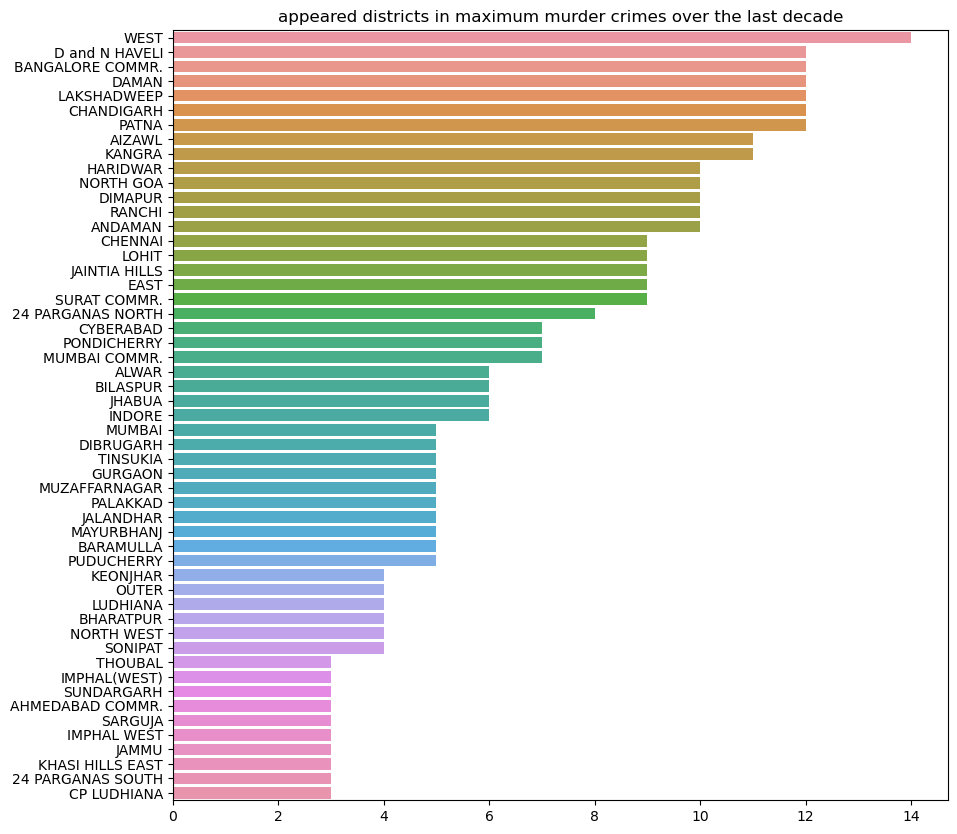

In [227]:
plt.figure(figsize=(10,10))
sns.barplot(x=data.values , y= data.index)
plt.title('appeared districts in maximum murder crimes over the last decade')
plt.show()

Here we can see that,

1) The DISTRICT 'WEST' which has the same name in  STATES like 'SIKKIM' and 'TRIPURA' was the highest appeared in the last decade as the district which scored the highest number of murders registered yearwise. 
2) DISTRICTS such as  BANGALORE COMMR., D and N HAVELI, DAMAN, LAKSHADWEEP, CHANDIGARH scored the highest number of murder crimes registered in their states over the last decade yearwise.

In [234]:
data= df.groupby(['DISTRICT'])['No.of Murders'].sum().sort_values(ascending=False).reset_index()
data

,DISTRICT,No.of Murders
0,PATNA,4586
1,BANGALORE COMMR.,2831
2,RANCHI,2322
3,MUMBAI COMMR.,1542
4,24 PARGANAS NORTH,1521
5,CYBERABAD,1360
6,MUZAFFARNAGAR,1307
7,MUMBAI,1254
8,CHENNAI,1137
9,WEST,995


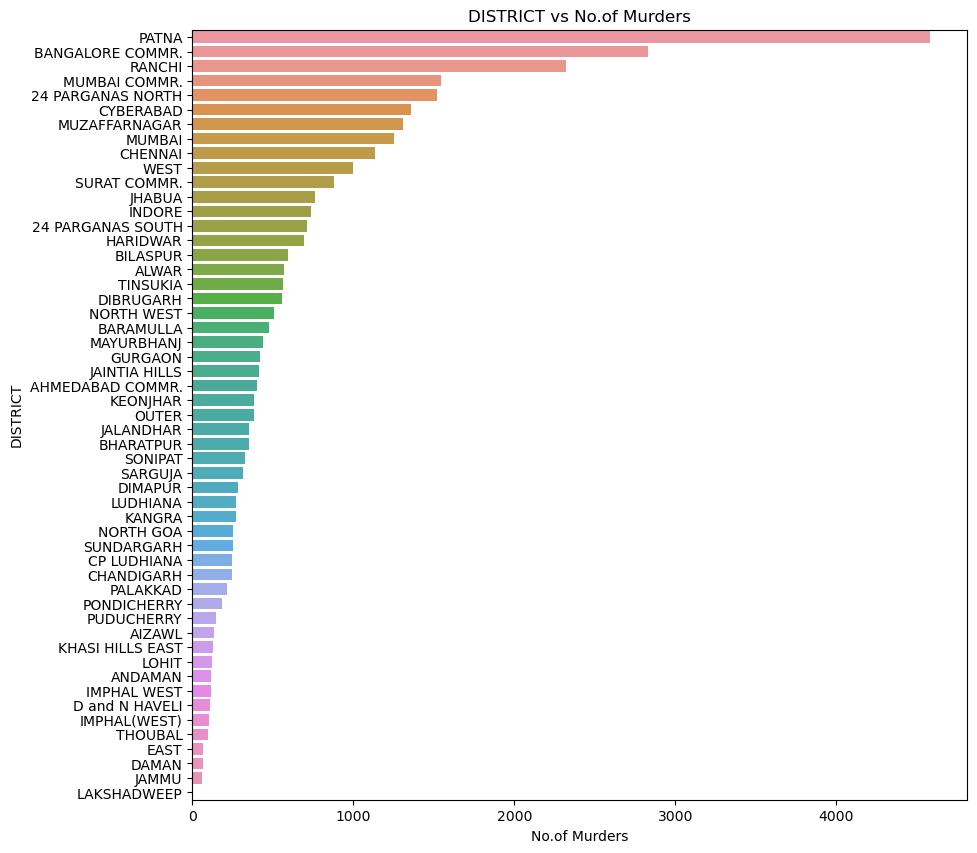

In [229]:
plt.figure(figsize=(10,10))
sns.barplot(x= 'No.of Murders' , y='DISTRICT',data=data)
plt.title('DISTRICT vs No.of Murders')
plt.xlabel('No.of Murders')
plt.ylabel('DISTRICT')
plt.show()

From the above, we can observe that

1) In Bihar 'Patna' District was the highest no.of murders registered evey year.
2) Among all districts 'Patna' has the highest sum of murders registered.
3) 'LAKSHADWEEP' was the lowest.

In [230]:
data_1= df.groupby(['DISTRICT'])['No.of Murders'].sum().sort_values(ascending=False).reset_index()[0:5]
data_2= df.groupby(['DISTRICT'])['No.of Murders'].sum().sort_values(ascending=False).reset_index()[-5:]

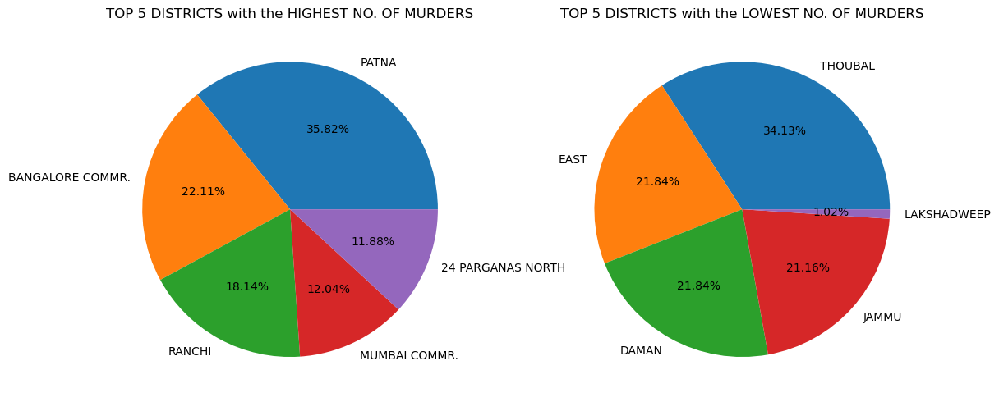

In [231]:
plt.subplots(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.pie(x='No.of Murders' , labels='DISTRICT' , data=data_1 , autopct='%0.2f%%')
plt.title('TOP 5 DISTRICTS with the HIGHEST NO. OF MURDERS')
plt.subplot(1, 2, 2)
plt.pie(x='No.of Murders' , labels='DISTRICT' , data=data_2 , autopct='%0.2f%%')
plt.title('TOP 5 DISTRICTS with the LOWEST NO. OF MURDERS')
plt.tight_layout()
plt.show()

* District 'PATNA' has highest no. of murders among all districts which was repeated 3 or more than 3 years.
* District 'LAKSHADWEEP' has lowest no. of murders among all districts which was repeated 3 or more than 3 years.
* 'PATNA','BANGALORE COMMR.', 'RANCHI', 'MUMBAI COMMR.', '24 PARGANAS NORTH' are the top 5 districts with highest no.of murders registered.

In [232]:
data_1= df.groupby(['DISTRICT'])['No.of Murders'].sum().sort_values(ascending=False).reset_index()[0:5]
data_1

,DISTRICT,No.of Murders
0,PATNA,4586
1,BANGALORE COMMR.,2831
2,RANCHI,2322
3,MUMBAI COMMR.,1542
4,24 PARGANAS NORTH,1521


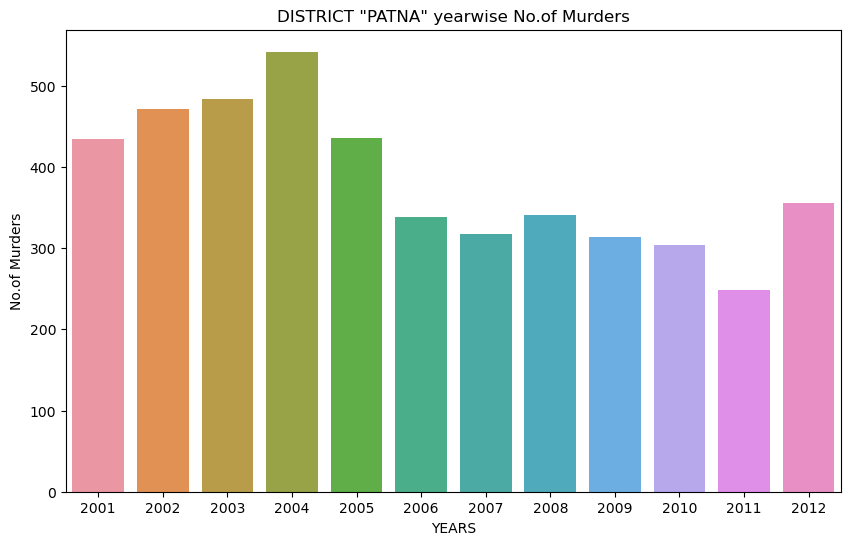

In [233]:
df_1=df.loc[df['DISTRICT'] == 'PATNA']
plt.figure(figsize=(10,6))
sns.barplot(x= 'YEAR' , y='No.of Murders',data=df_1)
plt.title('DISTRICT "PATNA" yearwise No.of Murders')
plt.ylabel('No.of Murders')
plt.xlabel('YEARS')
plt.show()

From the above, we can observe that

1) In Bihar 'Patna' District was the highest no.of murders registered evey year.
2) In year 2004 was the highest murders happened in patna district.
3) From 2004 to 2011 the no.of murders has been declined.

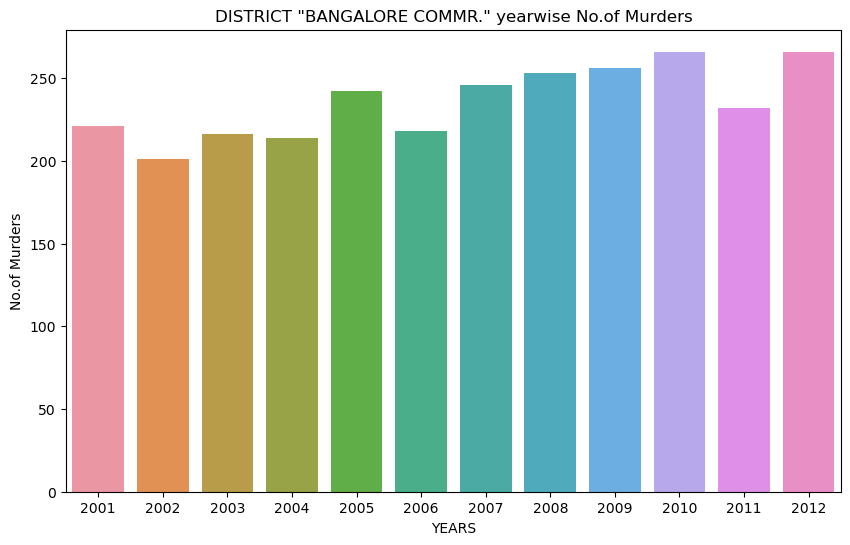

In [140]:
df_1=df.loc[df['DISTRICT'] == 'BANGALORE COMMR.']
plt.figure(figsize=(10,6))
sns.barplot(x= 'YEAR' , y='No.of Murders',data=df_1)
plt.title('DISTRICT "BANGALORE COMMR." yearwise No.of Murders')
plt.ylabel('No.of Murders')
plt.xlabel('YEARS')
plt.show()

Here, we can observe that

1) In Karnataka 'BANGALORE COMMR.' District was the highest no.of murders registered evey year.
2) In year 2012 was the highest murders happened in 'BANGALORE COMMR.'' district.
3) From 2001 to 2012 the no.of murders has been gradually increased.

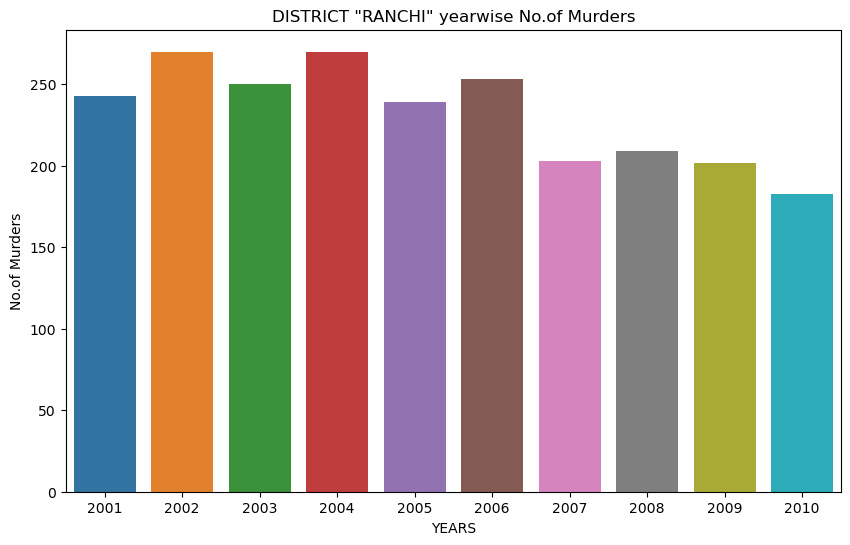

In [141]:
df_1=df.loc[df['DISTRICT'] == 'RANCHI']
plt.figure(figsize=(10,6))
sns.barplot(x= 'YEAR' , y='No.of Murders',data=df_1)
plt.title('DISTRICT "RANCHI" yearwise No.of Murders')
plt.ylabel('No.of Murders')
plt.xlabel('YEARS')
plt.show()

Here, we can observe that

1) In Jharkhand, 'RANCHI' District was the highest no.of murders registered from 2001 to 2010.
2) In year 2004 was the highest no.of murders happened in 'RANCHI' district.
3) From 2004 to 2010 the no.of murders has been gradually decreased.

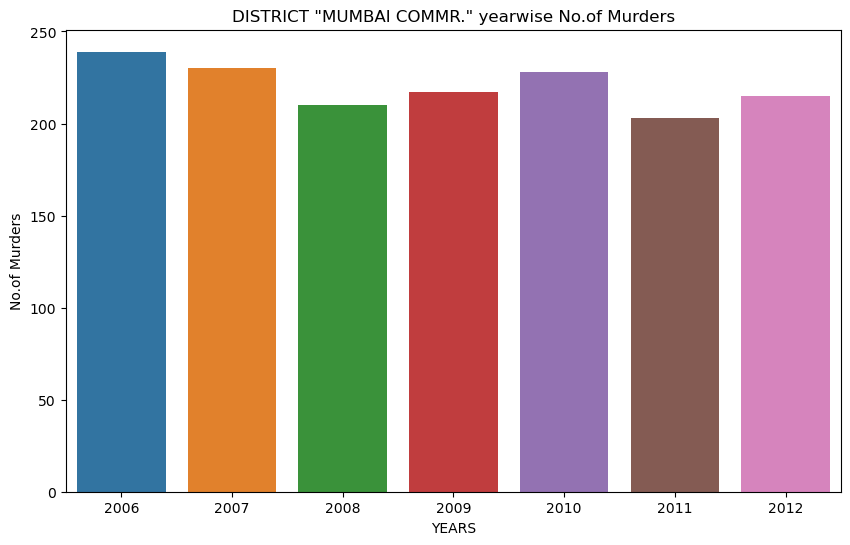

In [142]:
df_1=df.loc[df['DISTRICT'] == 'MUMBAI COMMR.']
plt.figure(figsize=(10,6))
sns.barplot(x= 'YEAR' , y='No.of Murders',data=df_1)
plt.title('DISTRICT "MUMBAI COMMR." yearwise No.of Murders')
plt.ylabel('No.of Murders')
plt.xlabel('YEARS')
plt.show()

Here, we can observe that

1) In Maharashtra, 'MUMBAI COMMR.' District was the highest no.of murders registered from 2006 to 2012.
2) In year 2006 was the highest no. of murders happened in 'MUMBAI COMMR.' district.

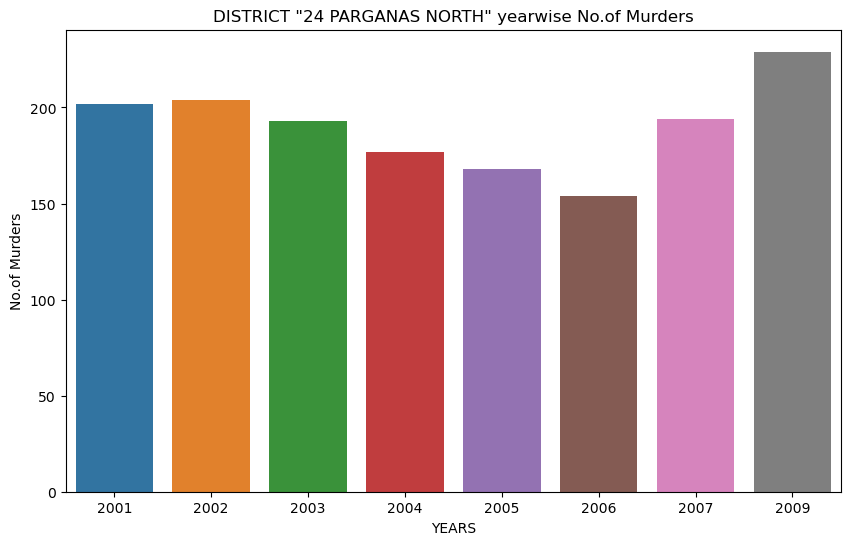

In [179]:
df_1=df.loc[df['DISTRICT'] == '24 PARGANAS NORTH']
plt.figure(figsize=(10,6))
sns.barplot(x= 'YEAR' , y='No.of Murders',data=df_1)
plt.title('DISTRICT "24 PARGANAS NORTH" yearwise No.of Murders')
plt.ylabel('No.of Murders')
plt.xlabel('YEARS')
plt.show()

Here, we can observe that

1) In WestBengal, '24 PARGANAS NORTH' District was the highest no.of murders registered from 2001 to 2009.
2) In year 2009 was the highest no.of murders happened in '24 PARGANAS NORTH' district.
3) From 2001 to 2006 the no.of murders has been gradually decreased.